In [6]:
# import spacec first
import spacec as sp

#import standard packages
import os
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

# silencing warnings
import warnings
warnings.filterwarnings('ignore')

plt.rc('axes', grid=False)  # remove gridlines
sc.settings.set_figure_params(dpi=80, facecolor='white') # set dpi and background color for scanpy figures


In [7]:
# Specify the path to the data
root_path = "/dss/dsshome1/00/ge65tib2/Spatialproteomics/" # replace with your path
data_path = root_path + 'example_data/raw/' # where the data is stored

# where you want to store the output
output_dir = root_path + 'example_data/output/'
os.makedirs(output_dir, exist_ok=True)

In [13]:
adata_2_4 = sc.read('/dss/dsshome1/00/ge65tib2/Spatialproteomics/ds_cellpose_2_4_zscore.h5ad')
adata_2_4.obs["unique_region"] = "2_4"
adata_2_4 # check the adata


AnnData object with n_obs × n_vars = 6888 × 40
    obs: 'centroid-0', 'centroid-1', 'unique_region'
    obsm: 'spatial'

In [14]:
adata_5_5 = sc.read('/dss/dsshome1/00/ge65tib2/Spatialproteomics/ds_cellpose_5_5_zscore.h5ad')
adata_5_5.obs["unique_region"] = "5_5"
adata_5_5 # check the adata

AnnData object with n_obs × n_vars = 10593 × 40
    obs: 'centroid-0', 'centroid-1', 'unique_region'
    obsm: 'spatial'

In [16]:
print(adata_5_5.obs.columns)

Index(['centroid-0', 'centroid-1', 'unique_region'], dtype='object')


In [17]:
clustering_random_seed = 7

Computing neighbors and UMAP
- neighbors
- UMAP
Clustering
Leiden clustering


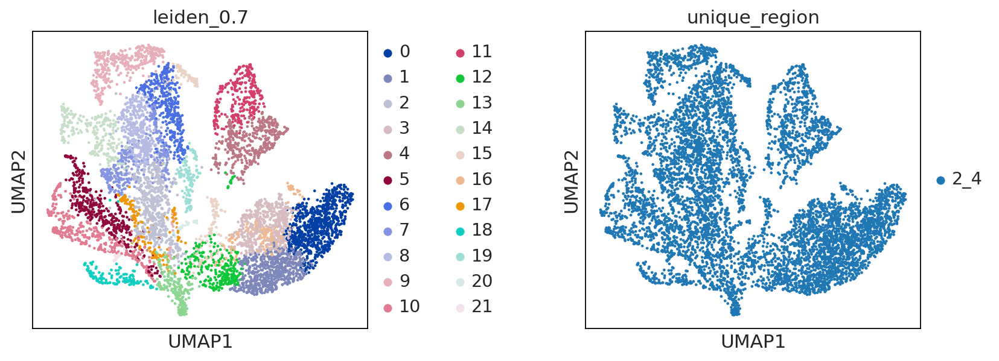

In [21]:
marker_list = [
    'SOX2', 'FAP', 'cxcr3', 'LRRC15', 'CD20', 'CD68', 'CD45RO', 
    'CD31', 'PD-1', 'Ki67', 'Keratin 5', 'CD4', 'IFNG', 'SMA', 'CD66', 
    'Podoplanin', 'CXCR4', 'PGRN', 'Granzyme B', 'Pan-Cytokeratin', 'MARCO', 
    'CD56', 'HAS1', 'CD107a', 'b-Catenin1', 'HLA-A', 'HLA-DR', 'CD8', 'PDL1', 
    'TP63', 'GATA6', 'CD34', 'TCF-1', 'Bcl-2', 'PCNA', 'CLDN18', 'CD3e', 'MCT4', 'LAG3']

adata_leiden = sp.tl.clustering(
    adata_2_4, 
    clustering='leiden', # can choose between leiden and louvian
    n_neighbors= 10, # number of neighbors for the knn graph
    resolution = 0.7, #clustering resolution (higher resolution gives more clusters)
    reclustering = False, # if true, no computing the neighbors
    marker_list = marker_list, #if it is None, all variable names are used for clustering
    seed=clustering_random_seed, # random seed for clustering - reproducibility
)

# visualization of clustering with UMAP
sc.pl.umap(adata_leiden, color = ['leiden_0.7', 'unique_region'], wspace=0.5)

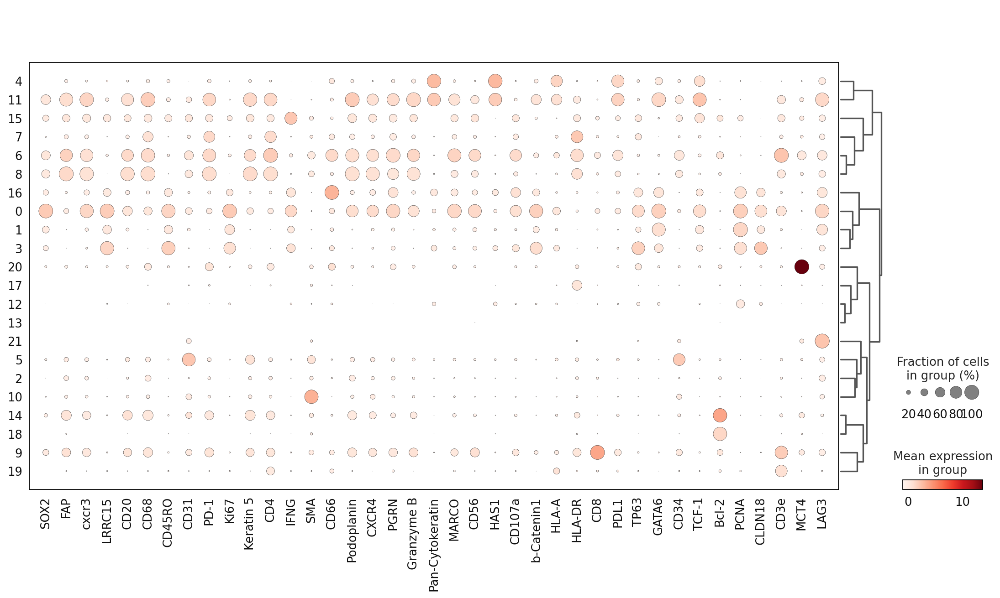

In [22]:
sc.pl.dotplot(adata_leiden, 
              marker_list, # The list of markers to show on the x-axis
              'leiden_0.7', # The cluster column
              dendrogram = True) # Show the dendrogram

In [23]:
# subclustering cluster 0, 3, 4 sequentially (could be optional for your own data)
sc.tl.leiden(adata_leiden, 
             seed=clustering_random_seed, # random seed for clustering - reproducibility
             restrict_to=('leiden_0.7',['0']), # select the cluster column name (your previously generated key) and the cluster name you want to subcluster
             resolution=0.3, # resolution for subclustering
             key_added='leiden_0.7_subcluster') # key added to adata.obs (keep it the same to avoid confusion and limit the adata object size)

# repeat the same for other clusters you want to subcluster
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['3']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['4']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['6']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['7']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['8']), resolution=0.3, key_added='leiden_0.7_subcluster')
sc.tl.leiden(adata_leiden, seed=clustering_random_seed, restrict_to=('leiden_0.7_subcluster',['11']), resolution=0.3, key_added='leiden_0.7_subcluster')

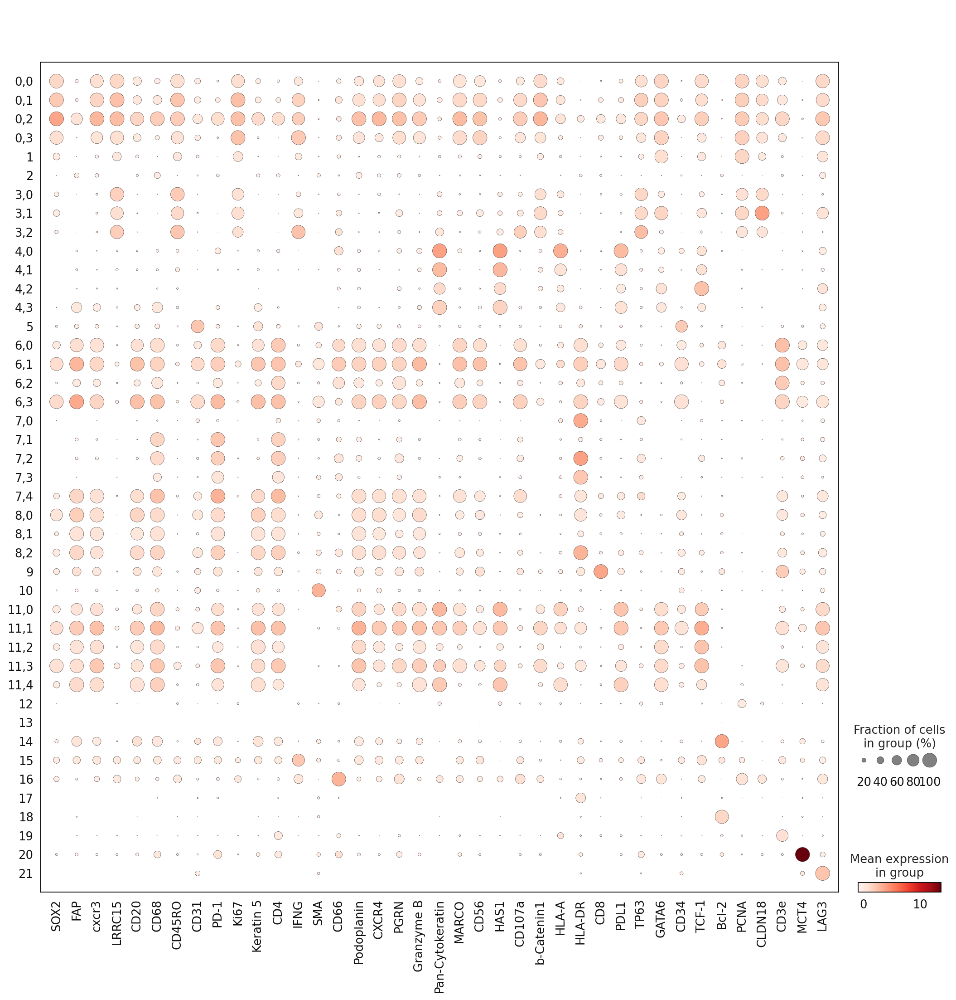

In [24]:
# Visualize cluster expression profiles 
sc.pl.dotplot(adata_leiden, 
              marker_list, 
              'leiden_0.7_subcluster', # The cluster column (now use the subcluster column)
              dendrogram = False)



In [13]:
# tentative annotation based on the marker 
# tentative annotation based on the marker 
cluster_to_ct_dict = {
    '0,0': 'recluster',
    '0,1': 'recluster',
    '0,2': 'recluster',
    '0,3': 'recluster',
    '1,0': 'recluster',
    '1,1': 'recluster',
    '1,2': 'classic tumor cells',
    '2,0': 'recluster',
    '2,1': 'recluster',
    '2,2': 'recluster',
    '2,3': 'recluster',
    '2,4': 'recluster',
    '3,0': 'recluster',
    '3,1': 'recluster',
    '3,2':'recluster',
    '3,3': 'recluster',
    '4': 'Noise',
    '5,0': 'myCAFs and Immune cells',
    '5,1': 'Noise',
    '5,2':'recluster',
    '5,3': 'recluster',
    '5,4': 'recluster',
    '6': 'Immune cells',
    '7,0': 'recluster',
    '7,1': 'recluster',
    '7,2': 'Immune cells',
    '7,3': 'Immune cells',
    '8,0': 'recluster',
    '8,1': 'recluster',
    '8,2':'recluster',
    '8,3': 'recluster',
    '9,0': 'Endothelial cells',
    '9,1': 'recluster',
    '10,0': 'recluster',
    '10,1': 'Cytotoxic T cells',
    '10,2': 'Cytotoxic T cells',
    '11': 'myCAFs',
    '12,0': 'recluster',
    '12,1': 'recluster',
    '12,2': 'recluster',
    '13': 'myCAFs',
    '14,0': 'recluster',
    '14,1': 'recluster',
    '15': 'Noise',
    '16,0': 'recluster',
    '16,1': 'recluster',
    '17,0': 'recluster',

}

# This allows us to generate a new column named cell_type_coarse based on the leiden_1_subcluster column
adata_leiden.obs['cell_type_coarse'] = ( # create a new column
    adata_leiden.obs['leiden_0.7_subcluster'] # get the cluster names
    .map(cluster_to_ct_dict) # map the cluster names to cell types
    .astype('category') # convert to category
)

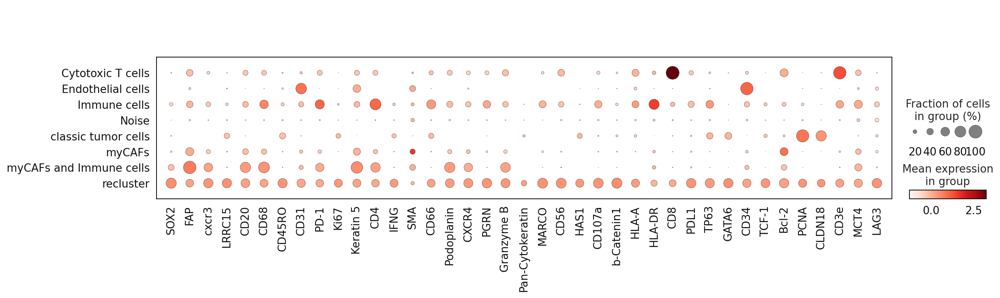

In [14]:
# Check the marker expression of the annotated cell types
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse', dendrogram = False)

,x,y,cell_type_coarse,condition
0,1420.232000,329.624000,classic tumor cells,pancreas
1,1427.107143,340.437500,recluster,pancreas
2,1364.210526,342.118421,Immune cells,pancreas
3,1290.170732,342.268293,classic tumor cells,pancreas
4,1522.344828,343.827586,Noise,pancreas
...,...,...,...,...
5956,1549.162651,2363.566265,classic tumor cells,pancreas
5957,1194.500000,2365.000000,myCAFs,pancreas
5958,1345.189189,2366.972973,recluster,pancreas
5959,1422.788732,2372.126761,recluster,pancreas


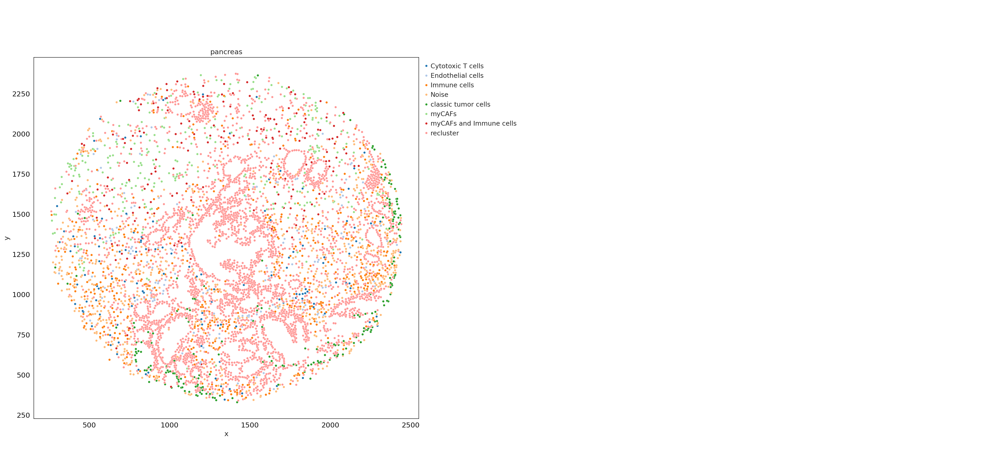

In [15]:
sp.pl.catplot(
    adata_leiden, 
    color = "cell_type_coarse", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette='tab20', #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "2_4_first_clustering", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17, # specify the figure size here
    size = 20) # specify the size of the points

In [16]:
# print the frequencies of cell types
adata_leiden.obs['cell_type_coarse'].value_counts()

cell_type_coarse
recluster                  3721
Noise                       775
Immune cells                514
myCAFs                      290
classic tumor cells         210
myCAFs and Immune cells     170
Endothelial cells           156
Cytotoxic T cells           125
Name: count, dtype: int64

In [17]:
sc.tl.leiden(adata_leiden, 
             seed=clustering_random_seed, 
             restrict_to=('cell_type_coarse',['recluster']), # select the cluster column name (your previously generated key) and the cluster name you want to subcluster
             resolution=1.5,
             key_added='cell_type_coarse_subcluster') # new column added to adata.obs

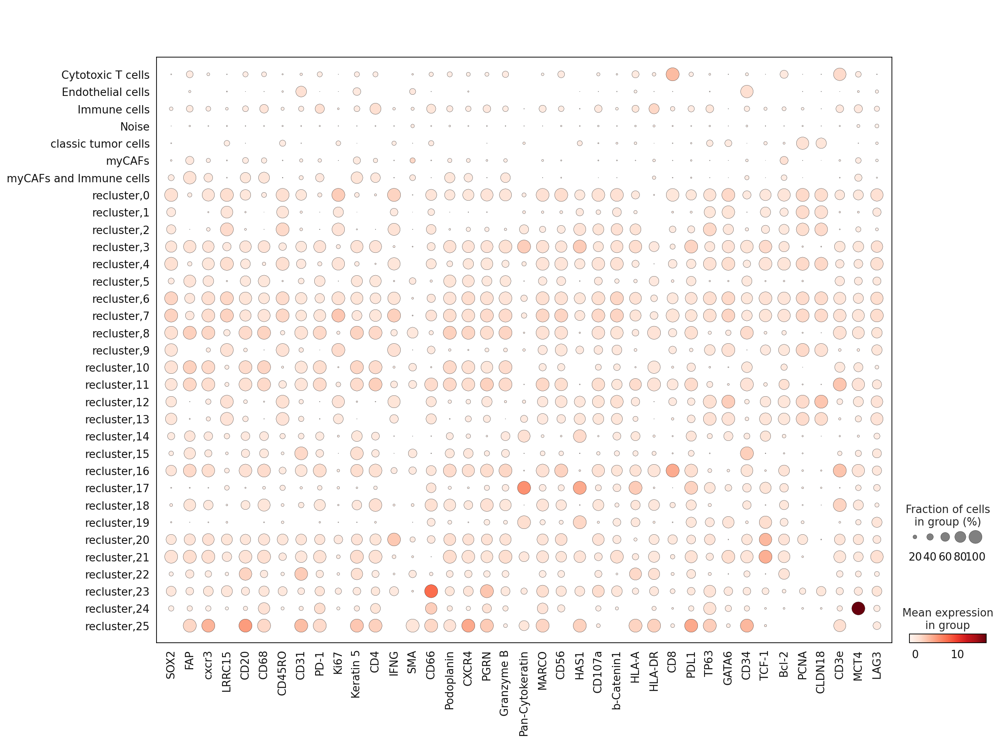

In [18]:
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse_subcluster', dendrogram = False)

In [22]:
# tentative annotation based on the marker 
cluster_to_ct_dict = {  
    'Noise': 'Noise',
    'Immune cells': 'Immune cells',
    'myCAFs': 'myCAFs', 
    'classic tumor cells':'classic tumor cells',
    'myCAFs and Immune cells': 'myCAFs and Immune cells', 
    'Endothelial cells': 'Endothelial cells',
    'Cytotoxic T cells': 'Cytotoxic T cells',
    'recluster,0': 'recluster',
    'recluster,1': 'recluster',
    'recluster,2': 'recluster',
    'recluster,3': 'recluster',
    'recluster,4': 'recluster',
    'recluster,5': 'recluster',
    'recluster,6': 'recluster',
    'recluster,7': 'recluster',
    'recluster,8': 'recluster',
    'recluster,9': 'recluster',
    'recluster,10': 'recluster',
    'recluster,11': 'recluster',
    'recluster,12': 'recluster',
    'recluster,13': 'recluster',
    'recluster,14': 'recluster',
    'recluster,15': 'recluster',
    'recluster,16': 'recluster',
    'recluster,17': 'recluster',
    'recluster,18': 'recluster',
    'recluster,19': 'recluster',
    'recluster,20': 'recluster',
    'recluster,21': 'recluster',
    'recluster,22': 'recluster',
    'recluster,23': 'recluster',
    'recluster,24': 'recluster',
    'recluster,25': 'recluster',

}

adata_leiden.obs['cell_type_coarse_f'] = (
    adata_leiden.obs['cell_type_coarse_subcluster']
    .map(cluster_to_ct_dict)
    .astype('category')
)

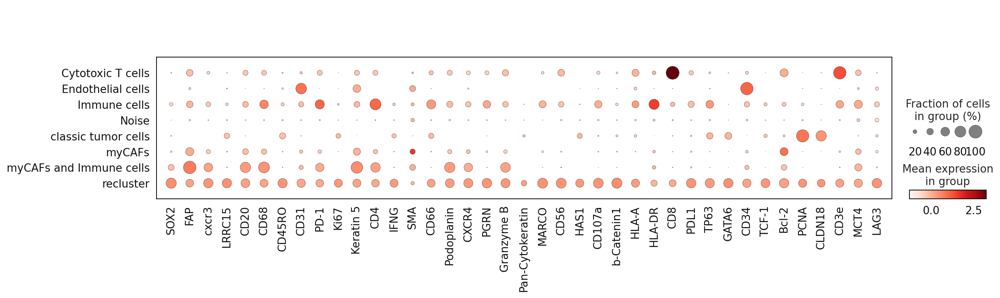

In [23]:
sc.pl.dotplot(adata_leiden, marker_list, 'cell_type_coarse_f', dendrogram = False)

In [24]:
adata_leiden.obs['cell_type_coarse_f'].value_counts()


cell_type_coarse_f
recluster                  3721
Noise                       775
Immune cells                514
myCAFs                      290
classic tumor cells         210
myCAFs and Immune cells     170
Endothelial cells           156
Cytotoxic T cells           125
Name: count, dtype: int64

In [25]:
adata = adata_leiden[~adata_leiden.obs['cell_type_coarse_f'].isin(['Noise'])]


In [26]:
sc.tl.leiden(adata, seed=clustering_random_seed, restrict_to=('cell_type_coarse_f',['recluster']), resolution=1.5, key_added='cell_type_coarse_f_subcluster')

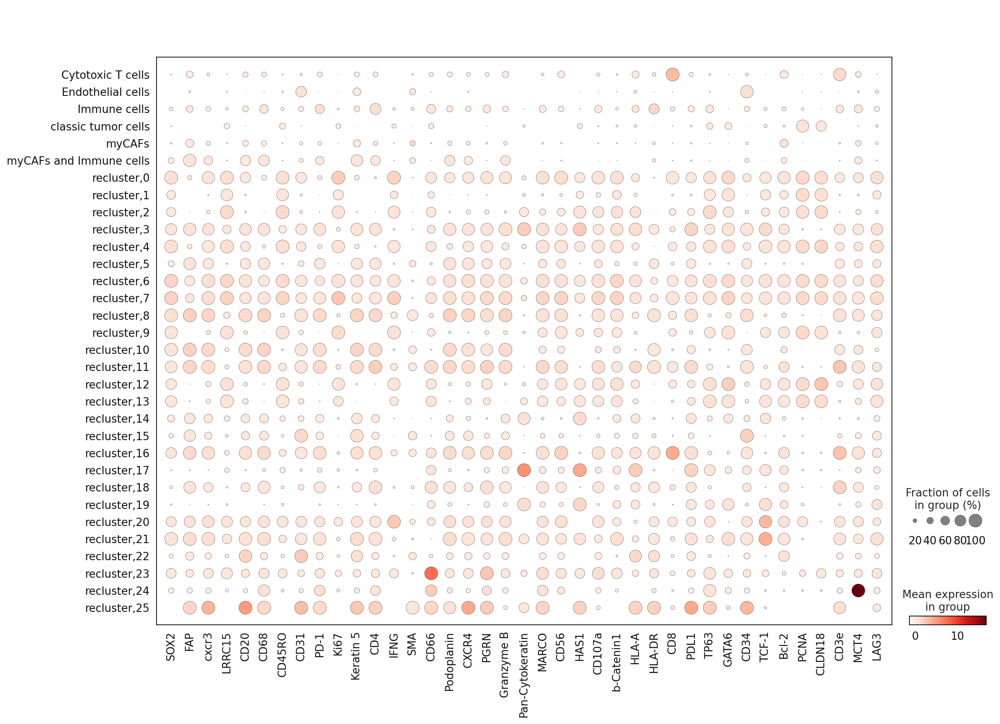

In [27]:
sc.pl.dotplot(adata, marker_list, 'cell_type_coarse_f_subcluster', dendrogram = False)

In [28]:
# scale and store results in layer
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

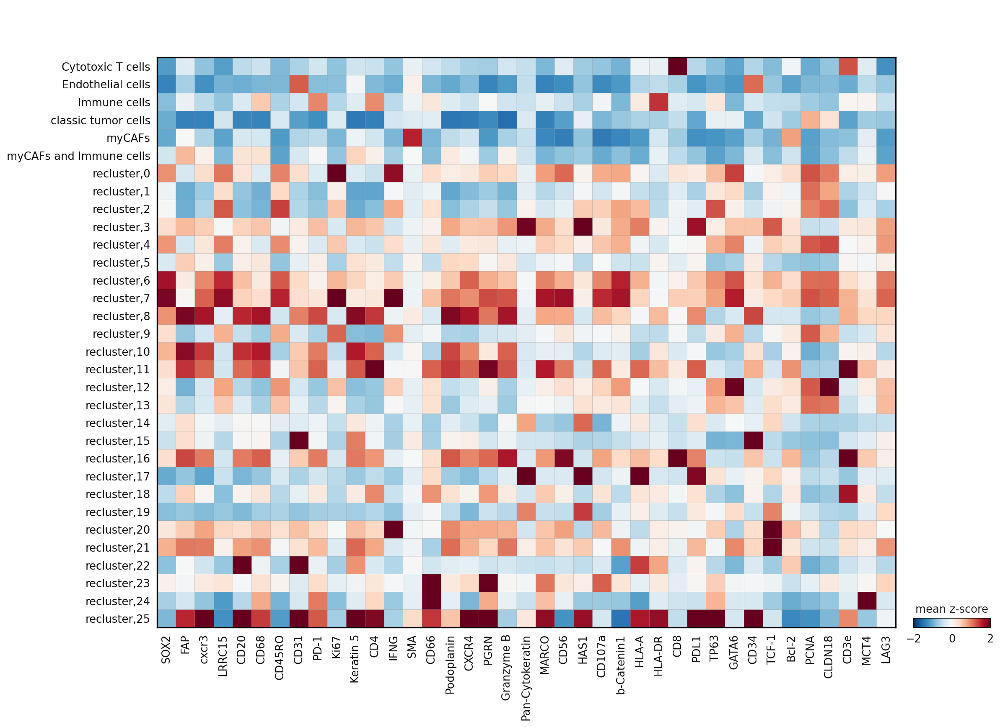

In [30]:
sc.pl.matrixplot(
    adata,
    marker_list,
    "cell_type_coarse_f_subcluster",
    dendrogram=False,
    colorbar_title="mean z-score",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
)

In [39]:
# tentative annotation based on the marker 
cluster_to_ct_dict = {  
    'Noise': 'Noise',
    'Immune cells': 'Immune cells',
    'myCAFs': 'myCAFs', 
    'classic tumor cells':'classic tumor cells',
    'myCAFs and Immune cells': 'myCAFs and Immune cells', 
    'Endothelial cells': 'Endothelial cells',
    'Cytotoxic T cells': 'Cytotoxic T cells',
    'recluster,0': 'recluster',
    'recluster,1': 'classic tumor cells',
    'recluster,2': 'myCAFs, classic tumor cells and basal tumor cells',
    'recluster,3': 'iCAFs',
    'recluster,4': 'myCAFs, classic tumor cells and basal tumor cells',
    'recluster,5': 'Noise',
    'recluster,6': 'recluster',
    'recluster,7': 'recluster',
    'recluster,8': 'recluster',
    'recluster,9': 'myCAFs and classic tumor cells',
    'recluster,10': 'recluster',
    'recluster,11': 'recluster',
    'recluster,12': 'classic tumor cells',
    'recluster,13': 'classic tumor cells',
    'recluster,14': 'iCAFs',
    'recluster,15': 'basal tumor cells and Endothelial cells',
    'recluster,16': 'recluster',
    'recluster,17': 'iCAFs',
    'recluster,18': 'Immune cells',
    'recluster,19': 'iCAFs',
    'recluster,20': 'recluster',
    'recluster,21': 'recluster',
    'recluster,22': 'Endothelial cells and B cells',
    'recluster,23': 'recluster',
    'recluster,24': 'recluster',
    'recluster,25': 'recluster',

}


adata.obs['cell_type'] = (
    adata.obs['cell_type_coarse_f_subcluster']
    .map(cluster_to_ct_dict)
    .astype('category')
)

In [40]:
adata = adata[~adata.obs['cell_type'].isin(['Noise'])]


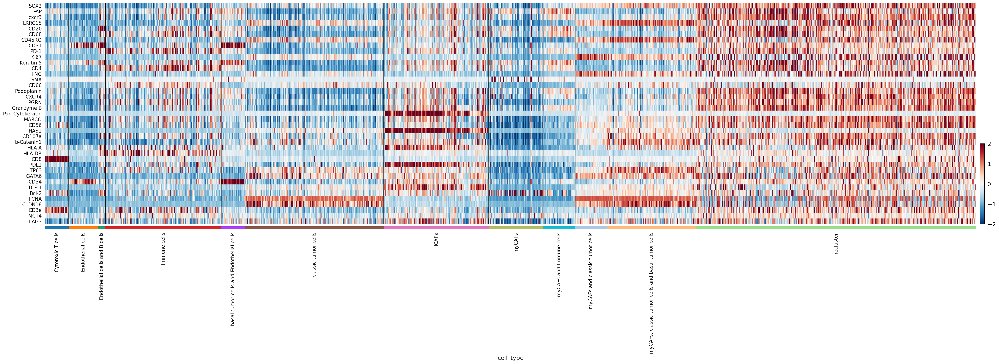

In [41]:
sc.pl.heatmap(
    adata,
    marker_list,
    groupby="cell_type",
    layer="scaled",
    vmin=-2,
    vmax=2,
    cmap="RdBu_r",
    dendrogram=False,
    swap_axes=True,
    figsize=(40, 10),
    show=True
)

In [42]:
adata.write(output_dir + "adata_nn_demo_annotated_only_2_4.h5ad")

In [43]:
adata.obs['cell_type'].value_counts()

cell_type
recluster                                            1491
classic tumor cells                                   739
Immune cells                                          617
iCAFs                                                 559
myCAFs, classic tumor cells and basal tumor cells     474
myCAFs                                                290
myCAFs and Immune cells                               170
myCAFs and classic tumor cells                        169
Endothelial cells                                     156
basal tumor cells and Endothelial cells               126
Cytotoxic T cells                                     125
Endothelial cells and B cells                          40
Name: count, dtype: int64

In [57]:
cell_type_colors = {
    'Immune cells' : '#1f77b4',           
    'classic tumor cells' : '#ff7f0e',        
    'myCAFs, classic tumor cells and basal tumor cells' : '#2ca02c',                
    'iCAFs' : '#d62728',           
    'myCAFs' : '#9467bd',     
    'myCAFs and Immune cells' : '#0ff4c6',     
    'myCAFs and classic tumor cells' : '#321325',               
    'Endothelial cells': '#bcbd22',
    'basal tumor cells and Endothelial cells': '#7f7f7f',
    'Cytotoxic T cells': '#17becf',
    'Endothelial cells and B cells': '#e377c2',
    'recluster' : '#f7dba7',
}

,x,y,cell_type,condition
0,1420.232000,329.624000,classic tumor cells,pancreas
1,1427.107143,340.437500,myCAFs and classic tumor cells,pancreas
2,1364.210526,342.118421,Immune cells,pancreas
3,1290.170732,342.268293,classic tumor cells,pancreas
5,1342.777778,346.066667,Cytotoxic T cells,pancreas
...,...,...,...,...
5956,1549.162651,2363.566265,classic tumor cells,pancreas
5957,1194.500000,2365.000000,myCAFs,pancreas
5958,1345.189189,2366.972973,recluster,pancreas
5959,1422.788732,2372.126761,iCAFs,pancreas


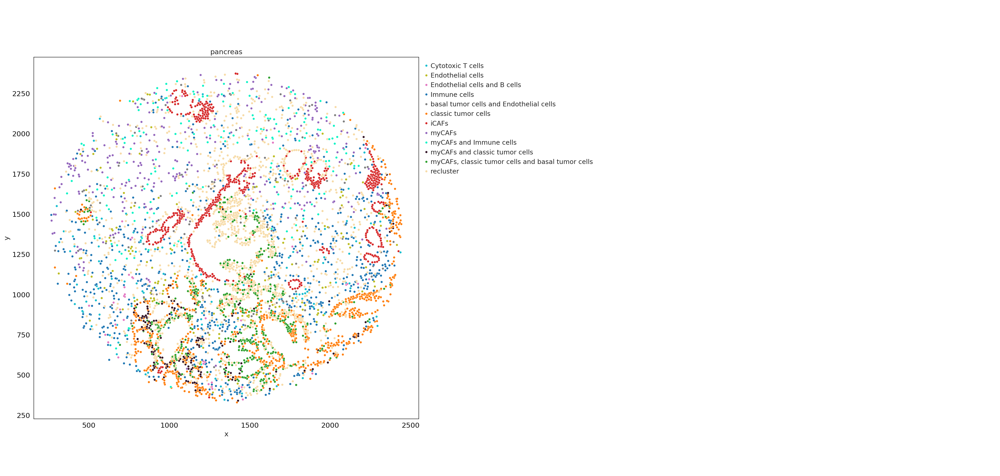

In [45]:
sp.pl.catplot(
    adata, 
    color = "cell_type", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "cell_type_tma_only_2_4", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17,
    size = 20)

In [47]:
cell_type_colors_1 = {
    'Immune cells' : '#1f77b4',           
    'classic tumor cells' : '#ff7f0e',        
    'myCAFs, classic tumor cells and basal tumor cells' : '#2ca02c',                
    'iCAFs' : '#d62728',           
    'myCAFs' : '#9467bd',     
    'myCAFs and Immune cells' : '#0ff4c6',     
    'myCAFs and classic tumor cells' : '#321325',               
    'Endothelial cells': '#bcbd22',
    'basal tumor cells and Endothelial cells': '#7f7f7f',
    'Cytotoxic T cells': '#17becf',
    'Endothelial cells and B cells': '#e377c2',
    'recluster' : 'white',
}

,x,y,cell_type,condition
0,1420.232000,329.624000,classic tumor cells,pancreas
1,1427.107143,340.437500,myCAFs and classic tumor cells,pancreas
2,1364.210526,342.118421,Immune cells,pancreas
3,1290.170732,342.268293,classic tumor cells,pancreas
5,1342.777778,346.066667,Cytotoxic T cells,pancreas
...,...,...,...,...
5956,1549.162651,2363.566265,classic tumor cells,pancreas
5957,1194.500000,2365.000000,myCAFs,pancreas
5958,1345.189189,2366.972973,recluster,pancreas
5959,1422.788732,2372.126761,iCAFs,pancreas


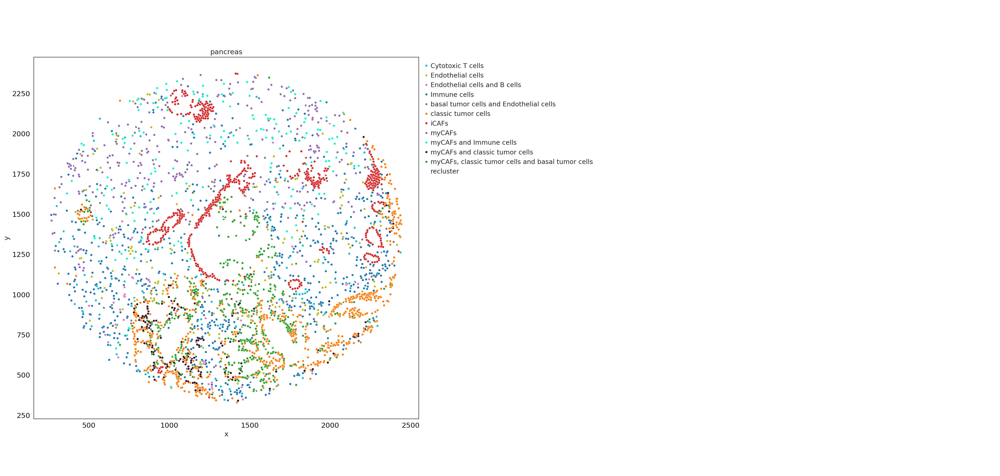

In [48]:
sp.pl.catplot(
    adata, 
    color = "cell_type", # specify group column name here (e.g. celltype_fine)
    unique_region = "condition", # specify unique_regions here
    X='x', Y='y', # specify x and y columns here
    n_columns=2, # adjust the number of columns for plotting here (how many plots do you want in one row?)
    palette=cell_type_colors_1, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # save figure as pdf
    output_fname = "cell_type_tma_without_recluster_only_2_4", # change it to file name you prefer when saving the figure
    output_dir=output_dir, # specify output directory here (if savefig=True)
    figsize= 17,
    size = 20)

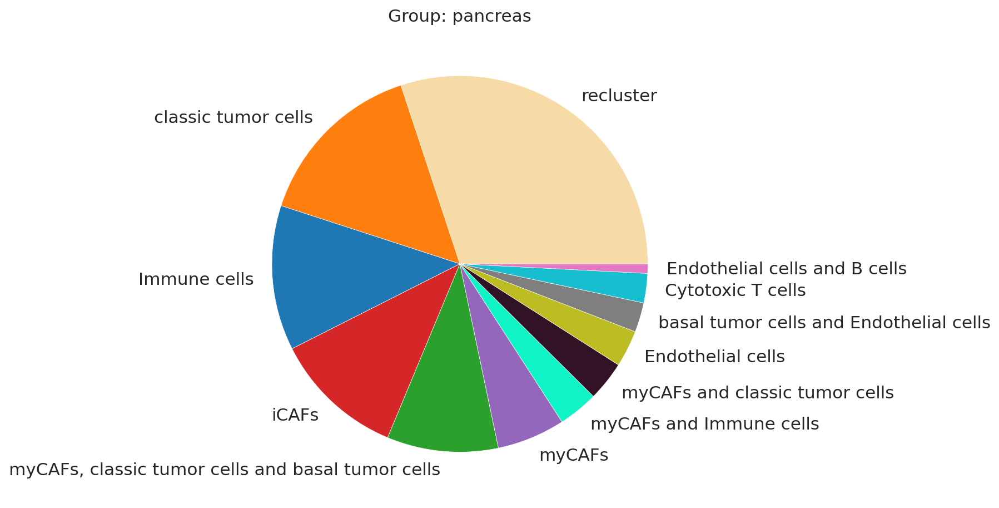

In [58]:
sp.pl.create_pie_charts(
    adata,
    color = "cell_type", 
    grouping = "condition", 
    show_percentages=False,
    palette=cell_type_colors, #default is None which means the color comes from the anndata.uns that matches the UMAP
    savefig=True, # change it to true if you want to save the figure
    output_fname = "cell_type_pie_charts_only_2_4",# change it to file name you prefer when saving the figure
    output_dir = output_dir #output directory for the figure
)
fig = plt.gcf()
fig.set_size_inches(60, 60)  # 设置想要的尺寸
